In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys
import copy
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import matplotlib as mat
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# sys.path.append("/data/user/tvaneede/GlobalFit/reco_processing/notebooks/weighting")
# from utils import *
# from selections import selection_mask
# from fonts import *
# from plot_utils import *

In [3]:
livetime_yr = 11.687
livetime_s  = livetime_yr * 365.25 * 24 * 3600 # 11.687 year

In [4]:
plotting_path = f"/data/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/plots/snowstorm"
os.system(f"mkdir -p {plotting_path}")

0

In [37]:
simulation_datasets = {}
sys.path.append("/data/user/tvaneede/GlobalFit/reco_processing")

from datasets import datasets_snowstorm as datasets
reco_versions =  ["ftp_ensemble_ani_v1" ] # v1 contains all channels, v2 only level3 muon
# reco_versions =  ["ftp_ensemble_ani_v1" ,"ftp_ensemble_ani_v2"] # v1 contains all channels, v2 only level3 muon
for reco_version in reco_versions: simulation_datasets[reco_version] = copy.deepcopy(getattr(datasets, reco_version))

from datasets import datasets_snowstorm_furst as datasets
reco_versions =  ["ftp_ensemble_v0" ] # v1 contains all channels, v2 only level3 muon
# reco_versions =  ["ftp_ensemble_v0" ,"ftp_ensemble_v1"] # v0 contains all channels, v2 only level3 muon
for reco_version in reco_versions: simulation_datasets[reco_version] = copy.deepcopy(getattr(datasets, reco_version))


# from datasets import datasets_hese as datasets
# reco_versions =  ["hese_iceprod_v7" ]
# for reco_version in reco_versions: simulation_datasets[reco_version] = copy.deepcopy(getattr(datasets, reco_version))

# from datasets import datasets_hese_extra as datasets
# reco_versions =  ["hese_extra_iceprod_v1" ]
# for reco_version in reco_versions: simulation_datasets[reco_version] = copy.deepcopy(getattr(datasets, reco_version))


In [6]:
# import opening and merging files
from open_and_merge import *

In [38]:
for key in simulation_datasets: simulation_datasets[key] = open_datasets_by_level(simulation_datasets[key],key)

----- Opening dataset NuMu_lowE
    -> Level level6_cascade
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_cascade_NuMu_23521.h5
    -> Level level6_hybrid
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_hybrid_NuMu_23521.h5
    -> Level level6_muon
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_muon_NuMu_23521.h5
----- Opening dataset NuMu_midE
    -> Level level6_cascade
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_cascade_NuMu_23522.h5
    -> Level level6_hybrid
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_hybrid_NuMu_23522.h5
    -> Level level6_muon
    -> file /data/user/tvaneede/GlobalFit/reco_processing/hdf/output/ftp_ensemble_ani_v1/merged/level6_muon_NuMu_23522.h5
    -> Level level7_cascade_evtgen

In [39]:
from open_and_merge import *
for key in simulation_datasets: 
    print(20*"=", key)
    simulation_datasets[key] = merge_datasets_by_level( simulation_datasets[key] )

==================== ftp_ensemble_ani_v1
----- Merging level level6_cascade
----- Merging level level6_hybrid
----- Merging level level6_muon
----- Merging level HESE_evtgen
----- Merging level HESE_taupede
Skipping level HESE_taupede, not present in any dataset
----- Merging level level7_cascade_evtgen
----- Merging level HESE
Skipping level HESE, not present in any dataset
----- Merging level level3_muon
Skipping level level3_muon, not present in any dataset


Skipping NuE/HESE_taupede, not merged
Skipping NuMu/HESE_taupede, not merged
Skipping NuTau/HESE_taupede, not merged
Skipping NuAll/HESE_taupede, not merged
Skipping NuE/HESE, not merged
Skipping NuMu/HESE, not merged
Skipping NuTau/HESE, not merged
Skipping NuAll/HESE, not merged
Skipping NuE/level3_muon, not merged
Skipping NuMu/level3_muon, not merged
Skipping NuTau/level3_muon, not merged
Skipping NuAll/level3_muon, not merged
Merging is consistent
==================== ftp_ensemble_v0
----- Merging level level6_cascade
----- Merging level level6_hybrid
----- Merging level level6_muon
----- Merging level HESE_evtgen
Skipping level HESE_evtgen, not present in any dataset
----- Merging level HESE_taupede
Skipping level HESE_taupede, not present in any dataset
----- Merging level level7_cascade_evtgen
Skipping level level7_cascade_evtgen, not present in any dataset
----- Merging level HESE
Skipping level HESE, not present in any dataset
----- Merging level level3_muon
Skipping level le

check if merging works now, seems to be fine

In [40]:
from event_rate import *
for key in simulation_datasets: 
    print(20*"=", key)
    print_event_rate( simulation_dataset=simulation_datasets[key] )

==================== ftp_ensemble_ani_v1
                           astro_NuE     astro_NuMu    astro_NuTau                conv         prompt
level6_cascade         781.65 ± 1.35  167.10 ± 0.38  560.49 ± 1.25  12778.048 ± 27.040  413.21 ± 0.60
level6_hybrid            2.48 ± 0.08   57.59 ± 0.25   12.63 ± 0.21   3740.226 ± 16.051   24.60 ± 0.10
level6_muon            298.72 ± 0.79   93.35 ± 0.23  221.38 ± 0.72  10834.442 ± 26.076  187.55 ± 0.37
HESE_evtgen             55.74 ± 0.36   20.75 ± 0.15   35.46 ± 0.28      41.232 ± 0.666   13.30 ± 0.07
level7_cascade_evtgen  287.02 ± 0.77   85.79 ± 0.33  251.35 ± 0.78    1429.605 ± 9.056  134.76 ± 0.30
==================== ftp_ensemble_v0
                    astro_NuE     astro_NuMu    astro_NuTau                conv         prompt
level6_cascade  792.19 ± 1.35  168.64 ± 0.38  561.88 ± 1.24  12942.745 ± 27.155  418.00 ± 0.59
level6_hybrid     2.50 ± 0.08   58.66 ± 0.25   12.58 ± 0.21   3801.155 ± 16.157   25.02 ± 0.10
level6_muon     299.39 ± 

Here I test my helper functions

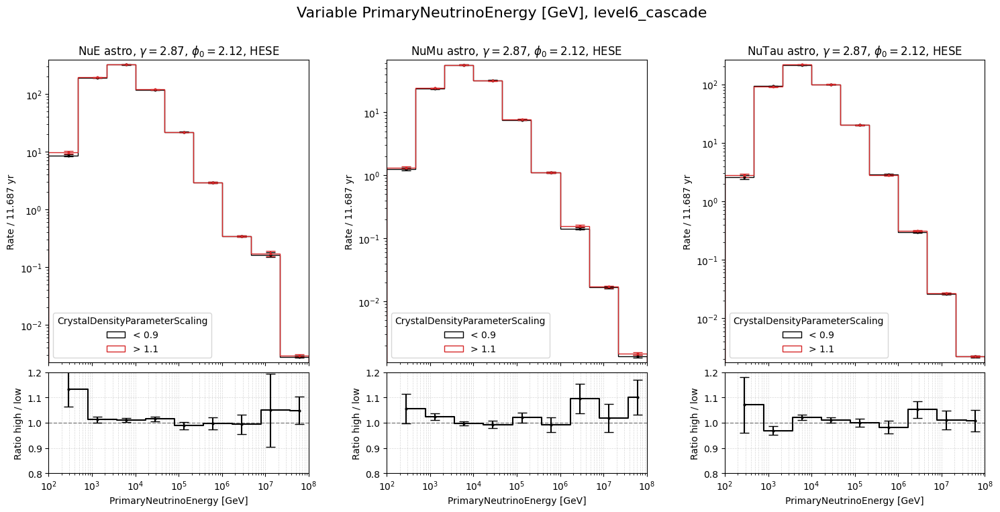

In [105]:
from advanced_plotting import *
compare_snowstorm_ensemble( 
simulation_datasets,
base_key = "ftp_ensemble_ani_v1", 
level = "level6_cascade",
base_var_key1 = "I3MCWeightDict", 
base_var_key2 = "PrimaryNeutrinoEnergy",
variable_name = "PrimaryNeutrinoEnergy [GeV]", 
syst_param    = "CrystalDensityParameterScaling",
syst_upper    = 0.9,
syst_lower    = 1.1,
bins = np.geomspace(1e2, 1e8, 10), xscale = "log", yscale = "log", livetime_yr = livetime_yr,
flux_gamma = 2.87,
flux_norm = 2.12 )


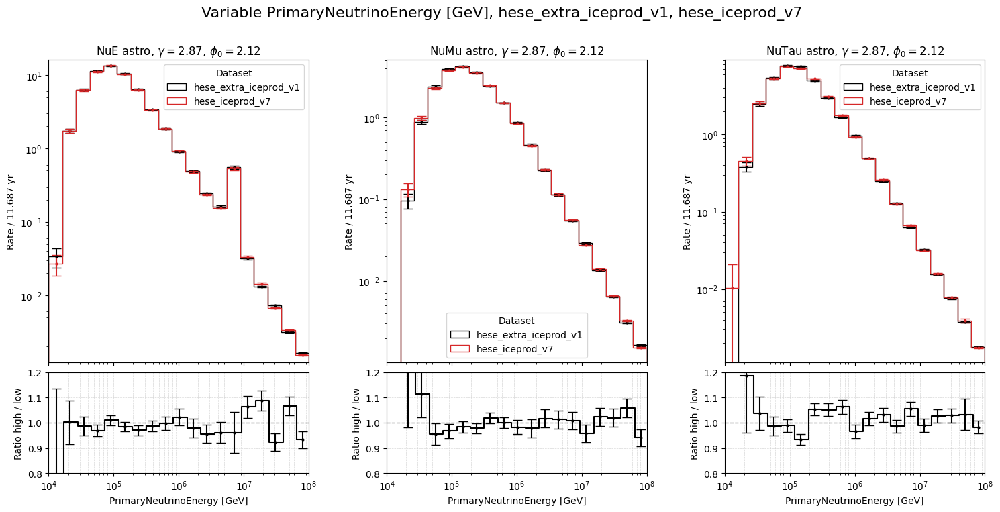

In [17]:
from advanced_plotting import *
compare_dataset_flavor(
simulation_datasets, 
base_key = "hese_extra_iceprod_v1",
base_level = "HESE_evtgen",
base_var_key1 = "I3MCWeightDict", 
base_var_key2 = "PrimaryNeutrinoEnergy",
alt_key = "hese_iceprod_v7",
alt_level = "HESE",
alt_var_key1 = "I3MCWeightDict", 
alt_var_key2 = "PrimaryNeutrinoEnergy",
variable_name = "PrimaryNeutrinoEnergy [GeV]",
bins = np.geomspace(1e4, 1e8, 20),
xscale = "log", yscale = "log", 
livetime_yr = 11.687,
flux_gamma = 2.87,
flux_norm  = 2.12,
plotting_path = None)


Let's actually make some plots

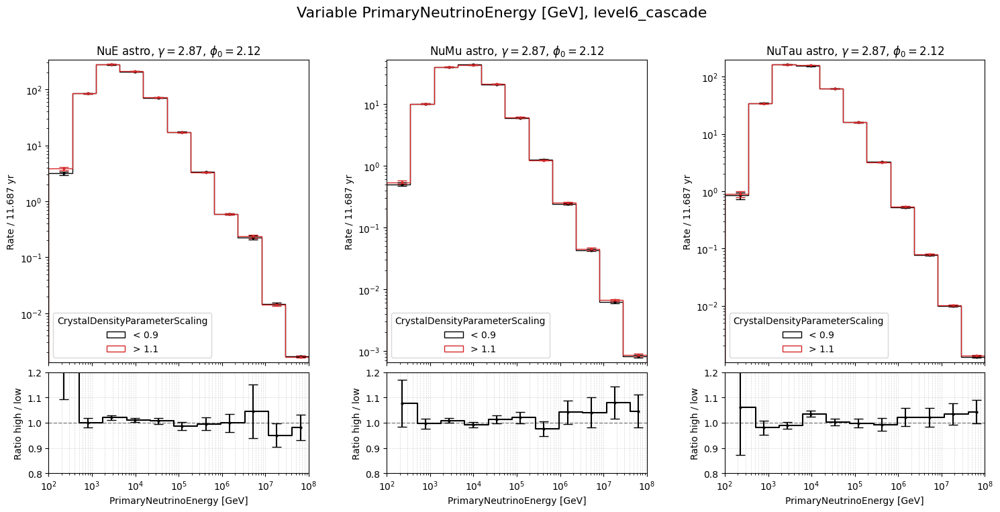

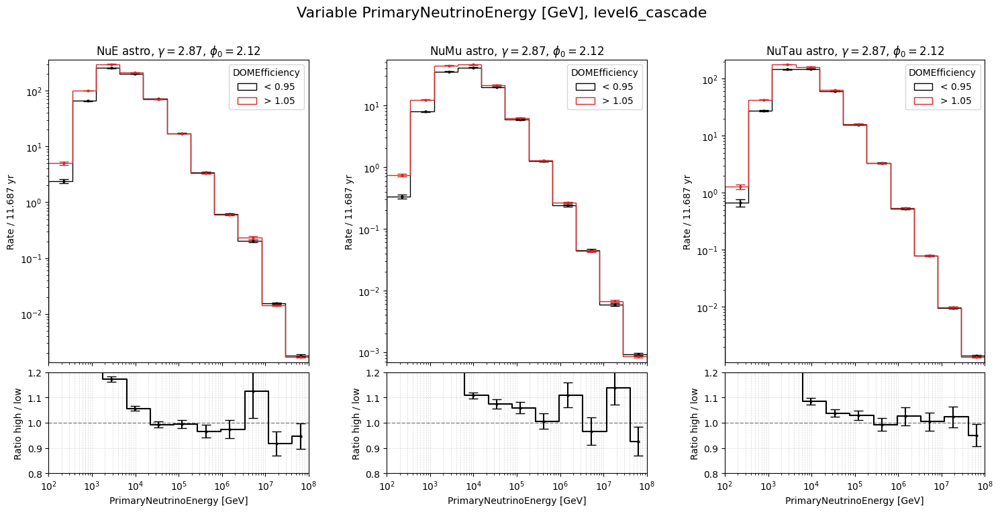

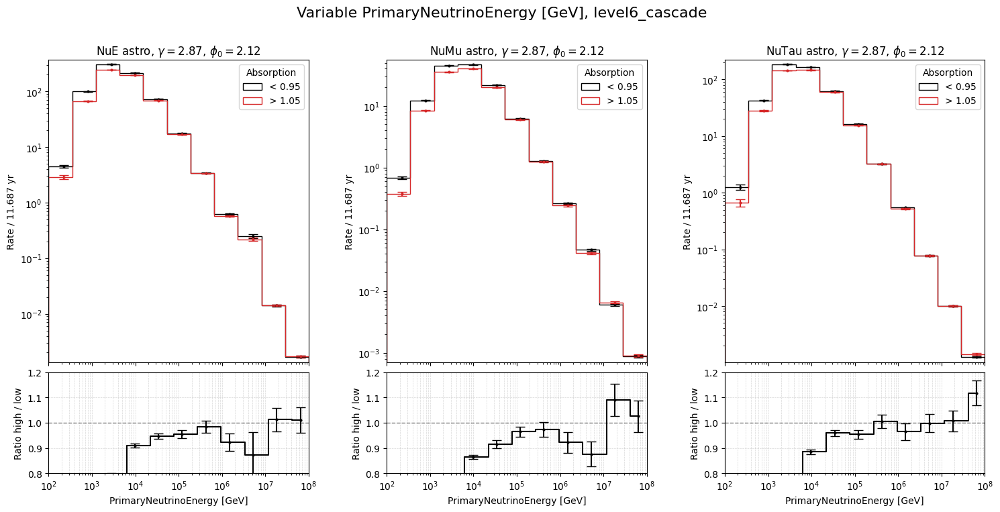

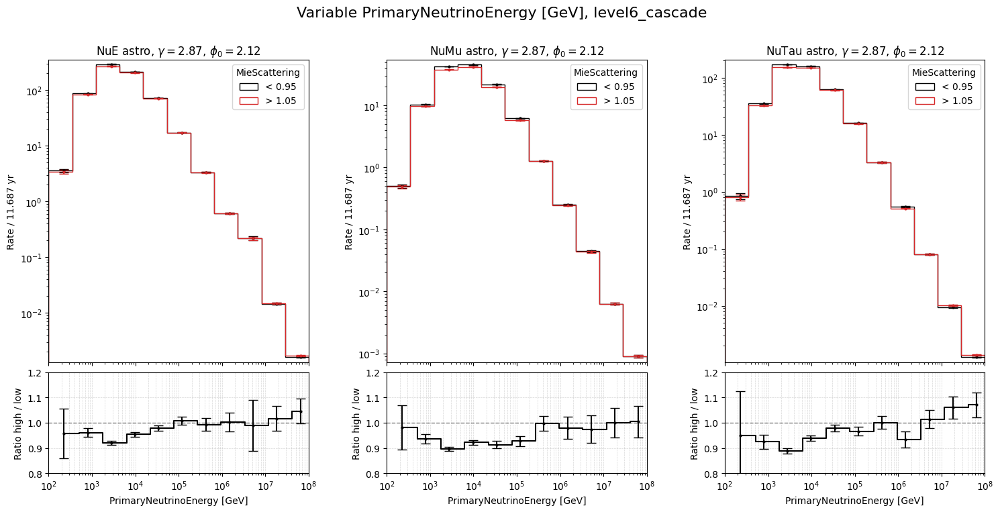

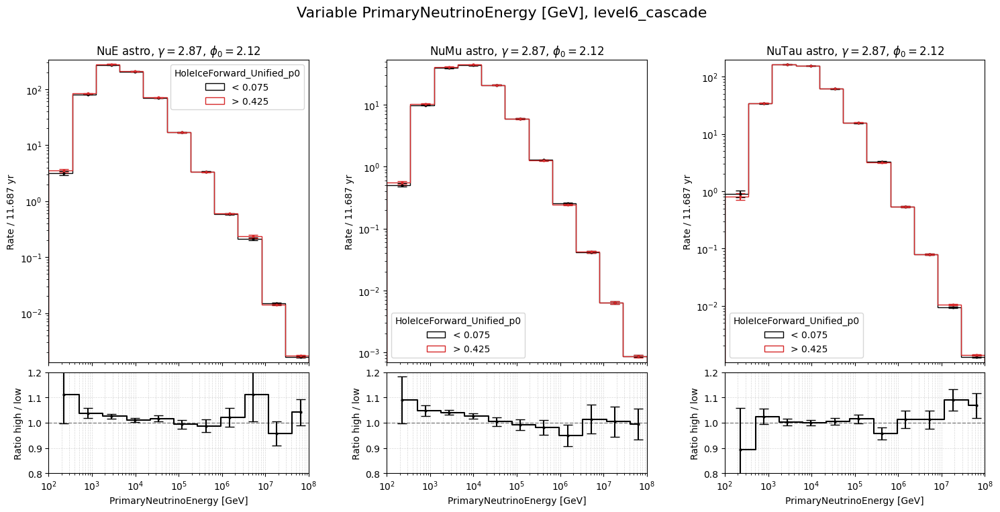

...

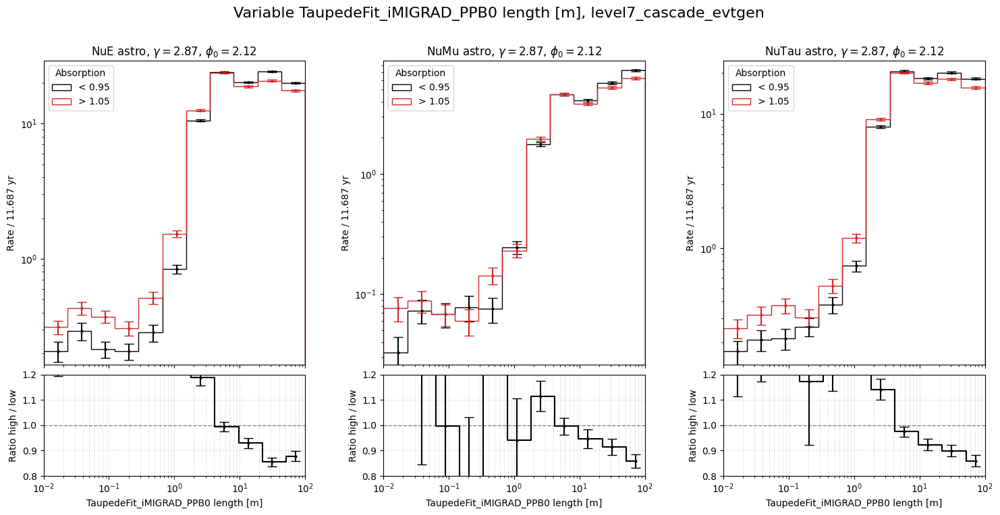

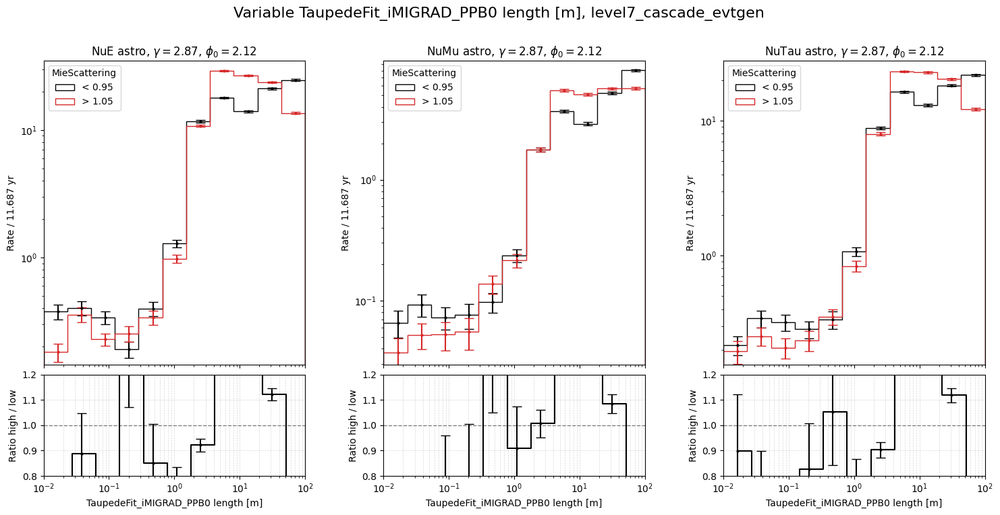

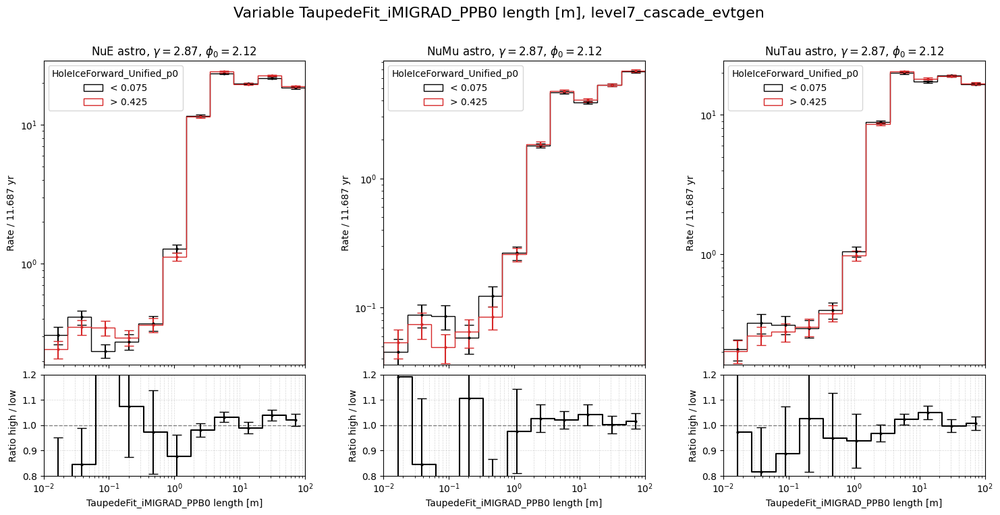

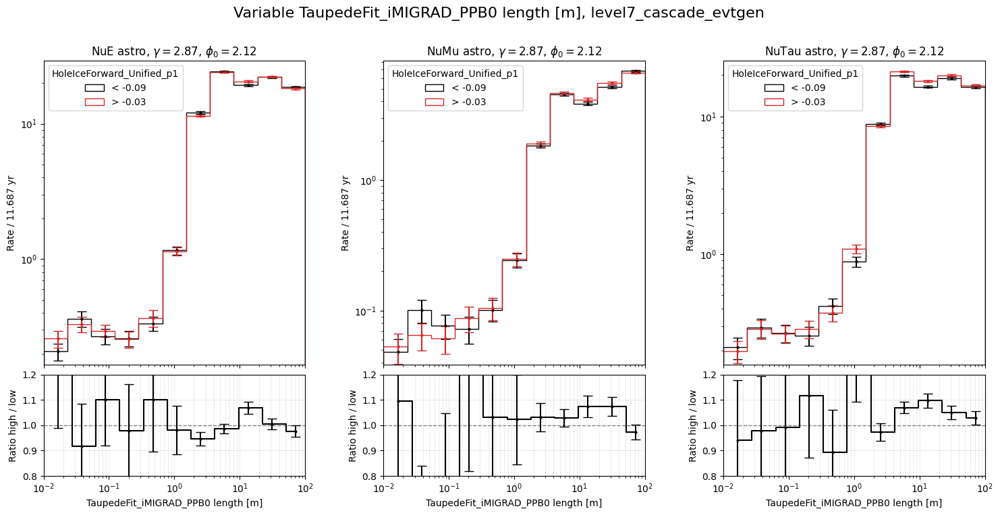

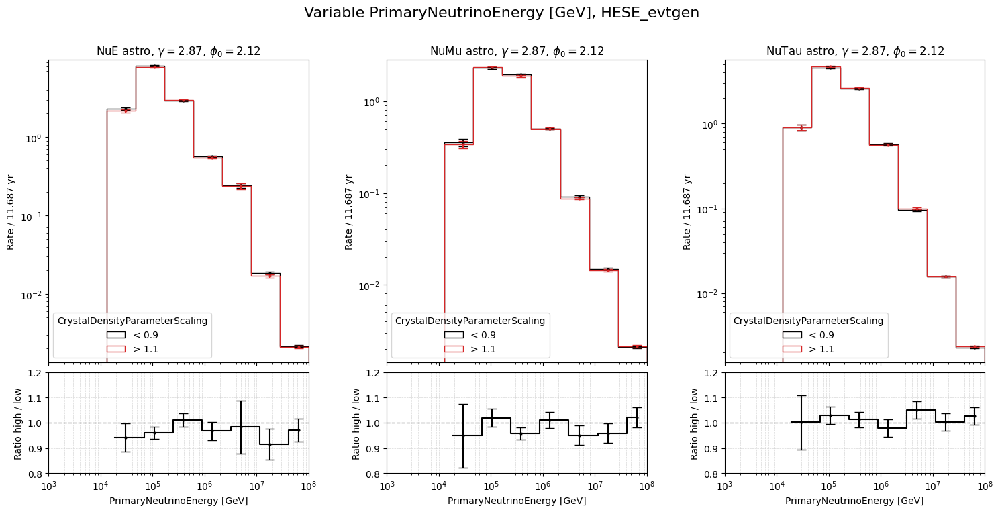

/mnt/ceph1-npx/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/advanced_plotting.py:69: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_high / hist_low


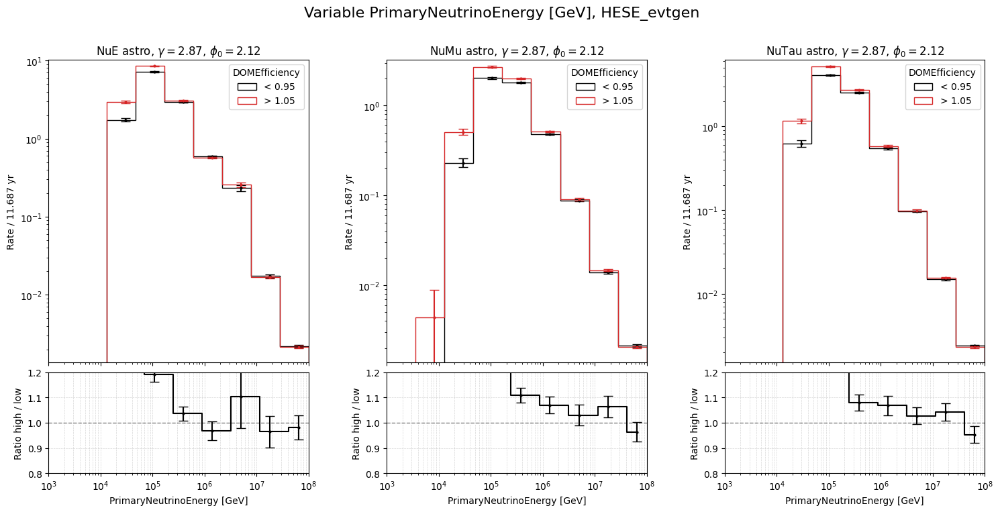

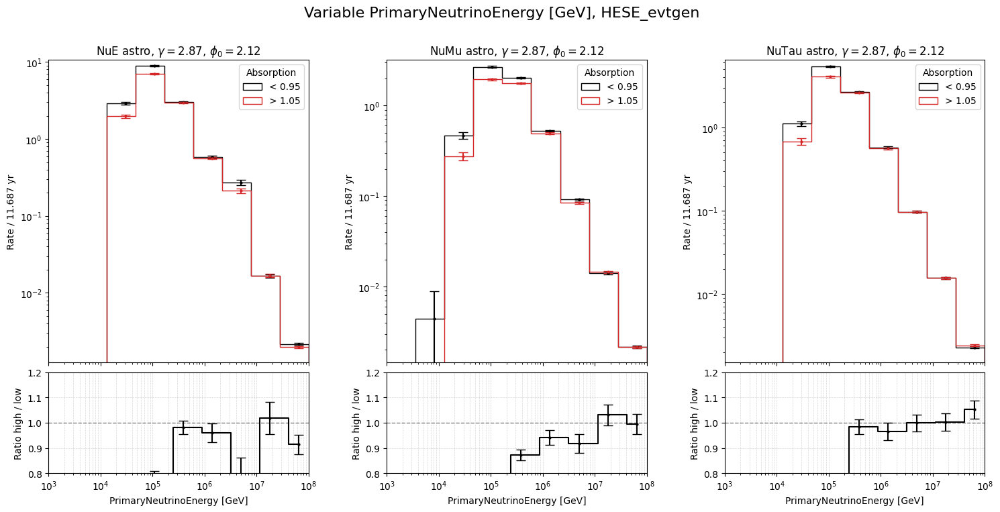

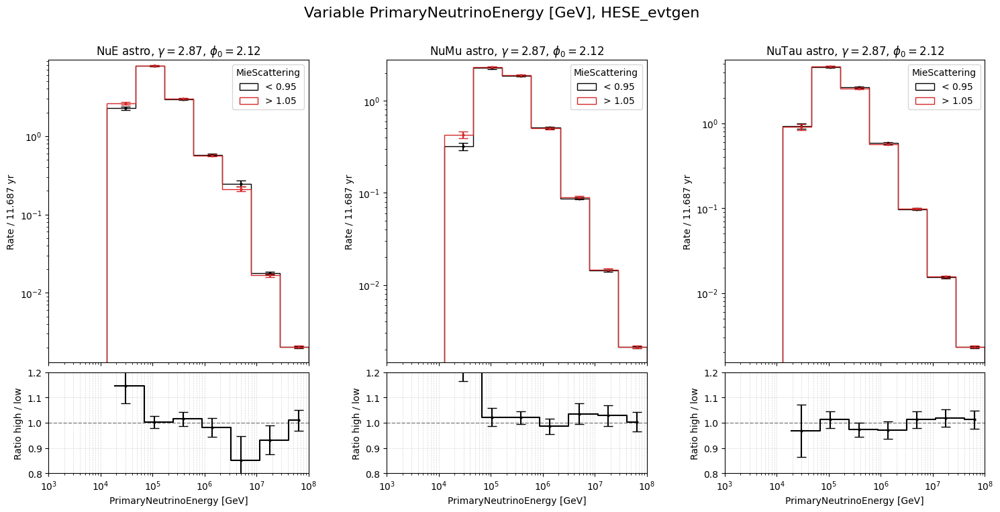

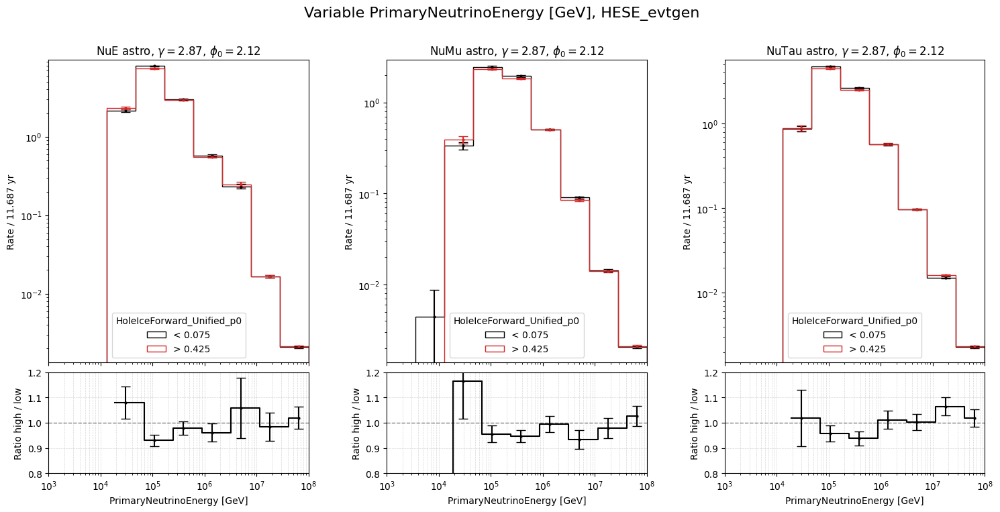

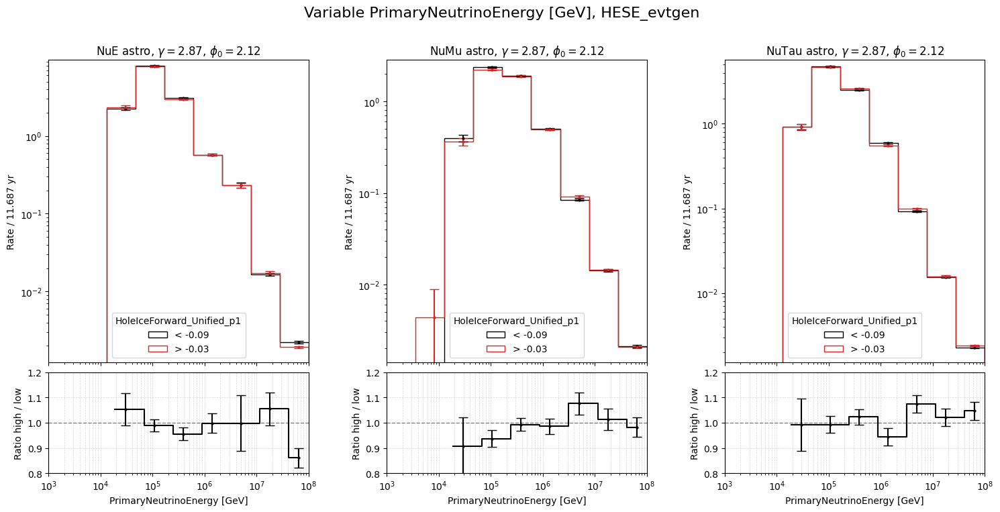

...

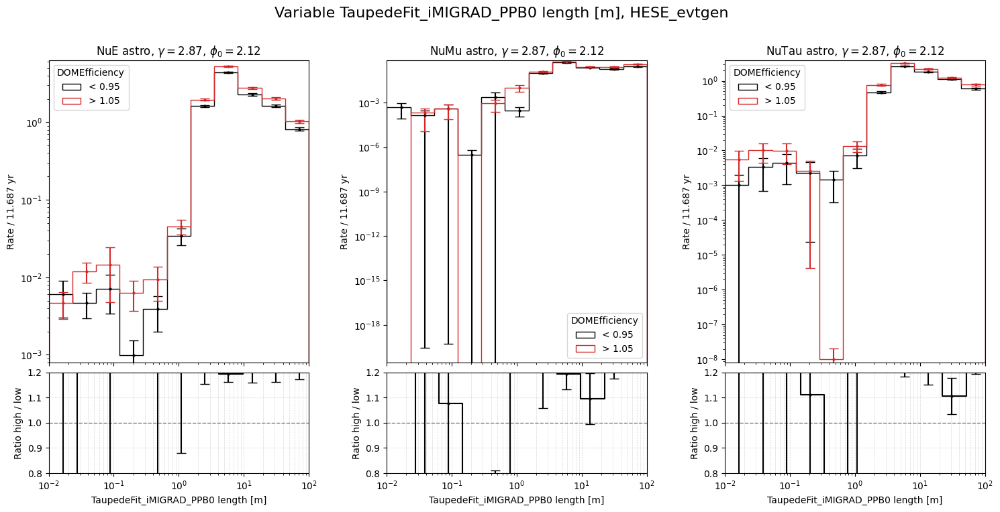

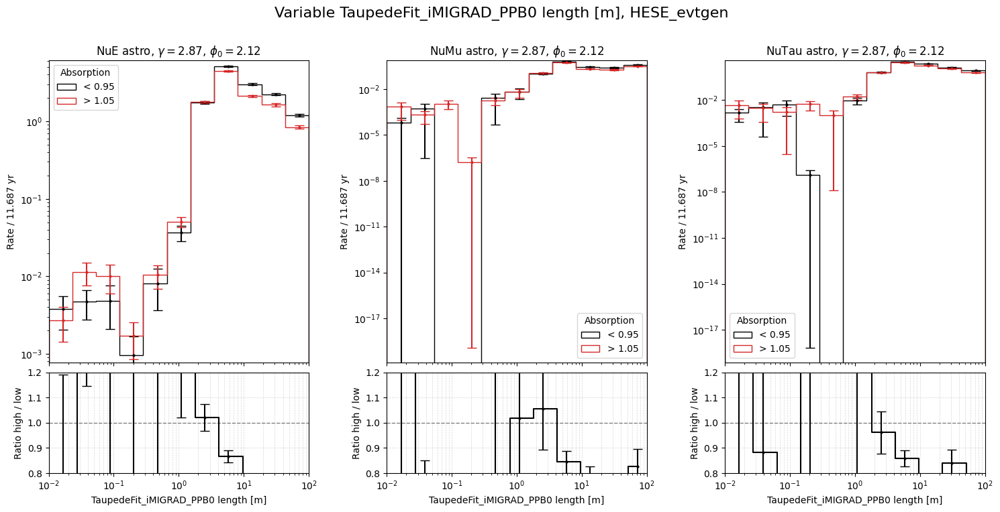

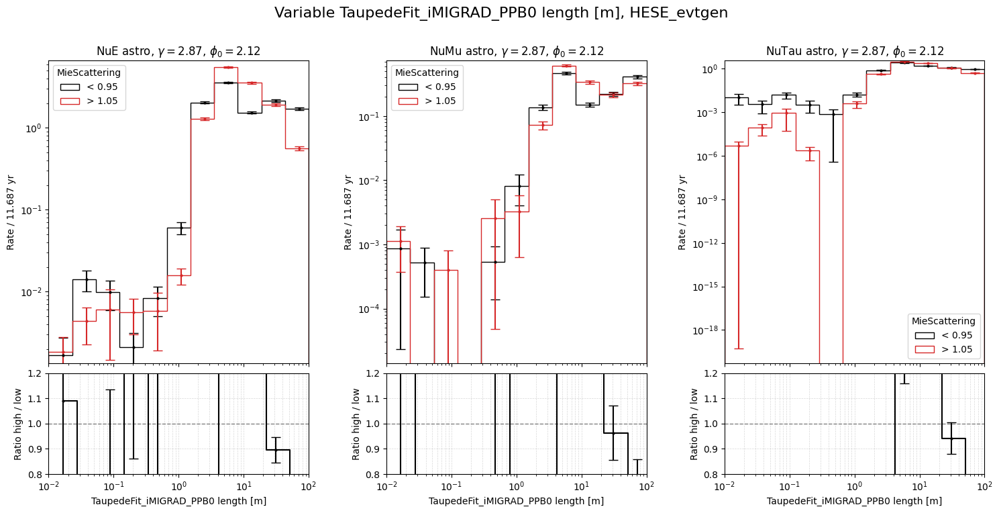

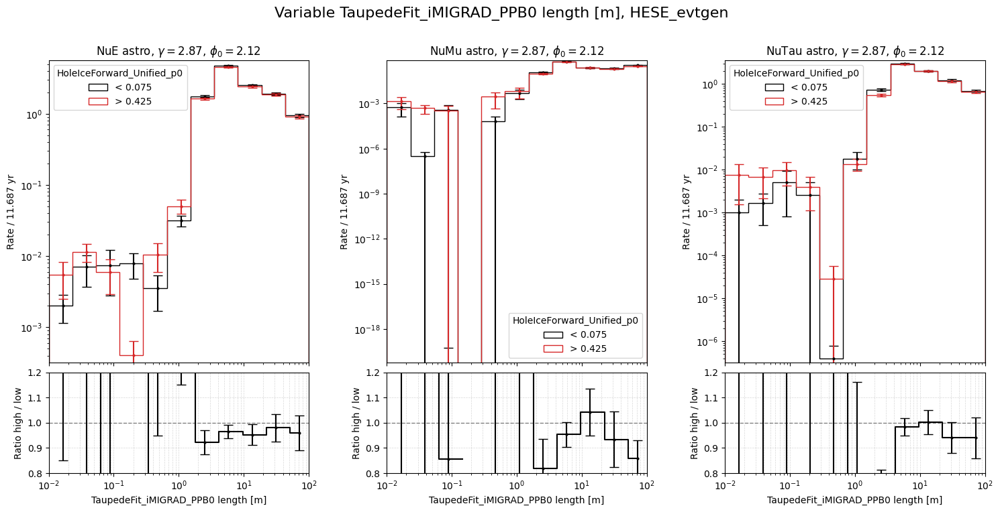

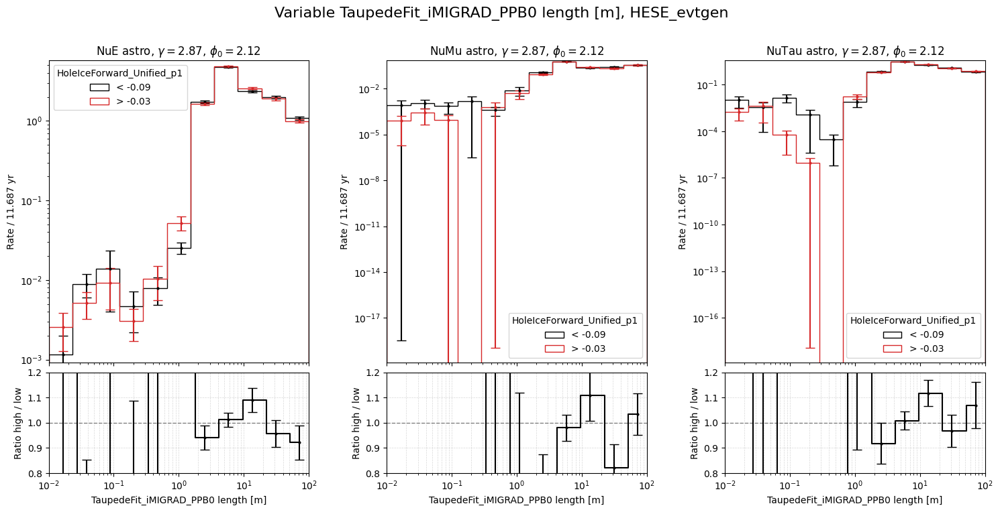

In [ ]:
###
### Plot the ensemble distribution for the upper and lower simulated part
###
from advanced_plotting import *
from variables import variables
from systematics import systematics

levels = ["level6_cascade", "level7_cascade_evtgen", "HESE_evtgen"]

base_key = "ftp_ensemble_ani_v1"
outpath = f"/data/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/plots/snowstorm/{base_key}/compare_snowstorm_ensemble"

for level in levels:
    for plot_name, variable_settings in variables[level].items():
        for systematic in systematics["half_range"]:
            
            syst_param = systematic["syst_param"]

            plotting_path = f"{outpath}/{level}/{syst_param}"
            os.system(f"mkdir -p {plotting_path}")
            plotting_path = f"{plotting_path}/{plot_name}.png"

            compare_snowstorm_ensemble_flavor( 
            simulation_datasets,
            base_key = base_key, 
            level = level,
            **variable_settings,
            **systematic,
            livetime_yr = livetime_yr,
            flux_gamma = 2.87,
            flux_norm = 2.12,
            plotting_path = plotting_path )

            break
        break
    break
            


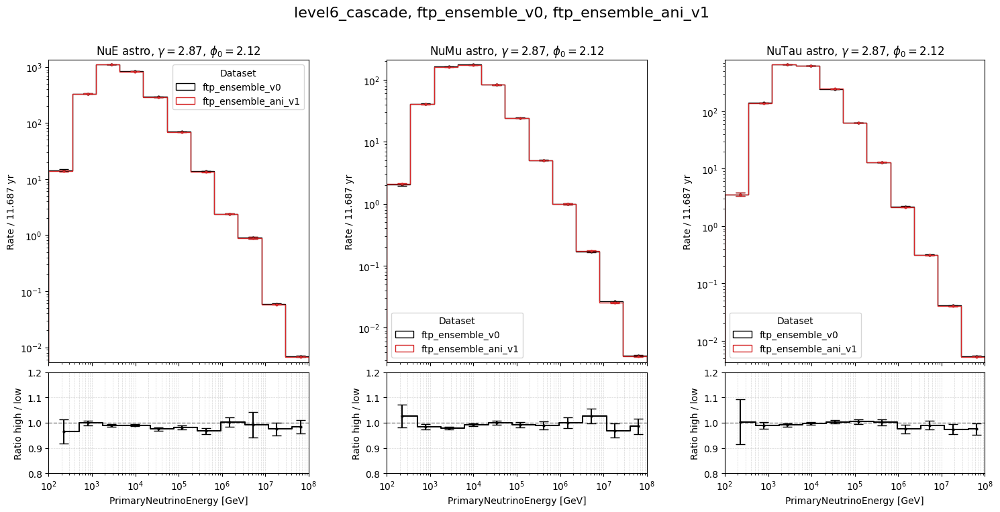

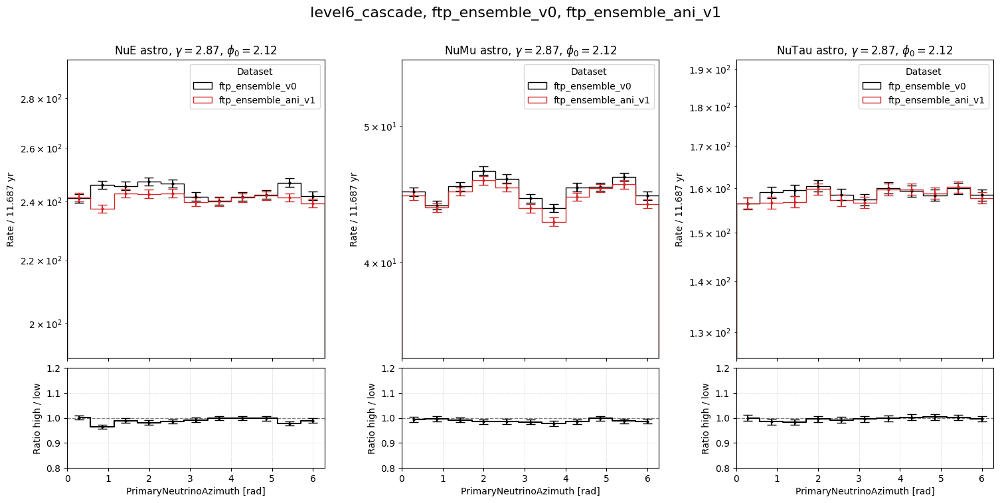

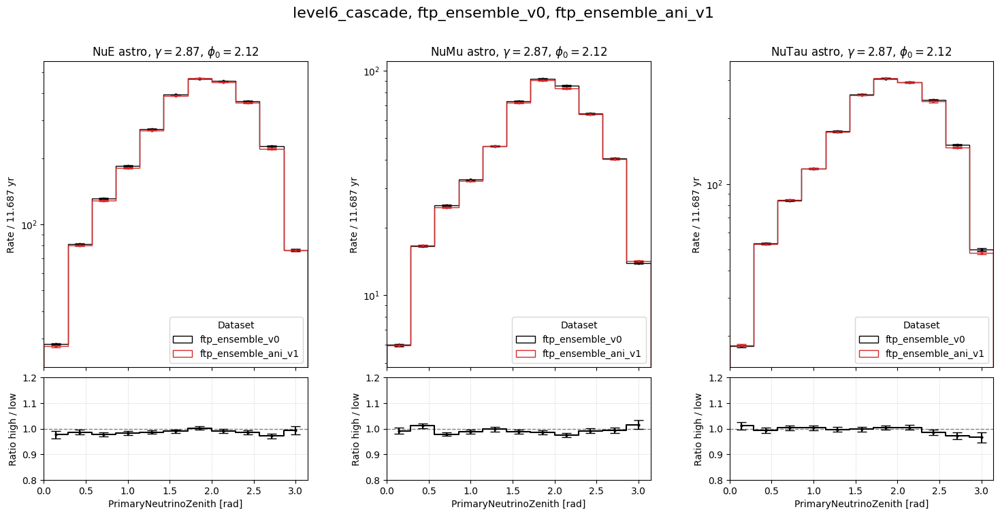

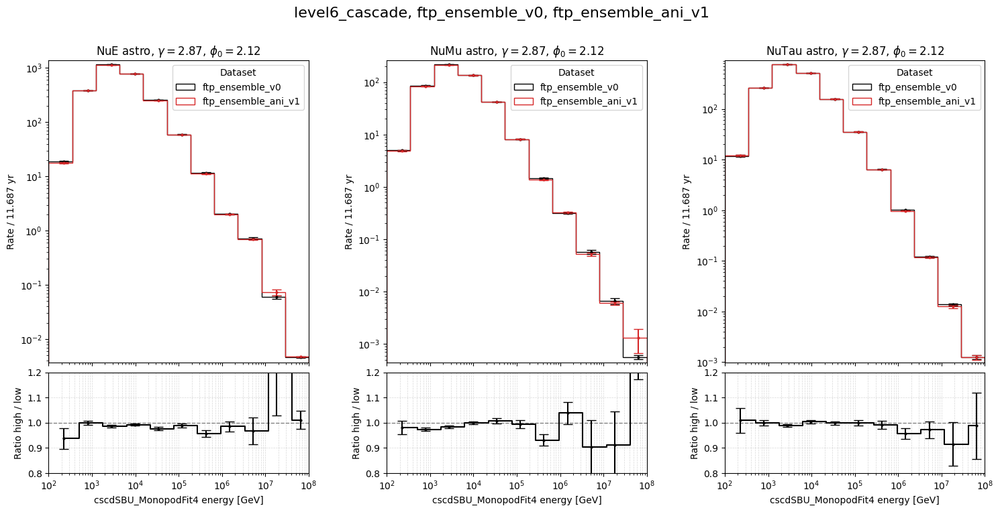

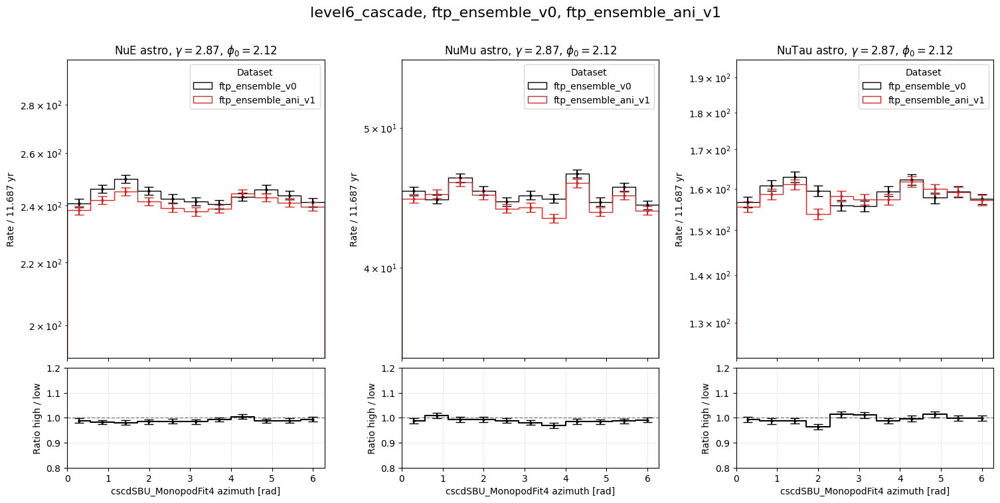

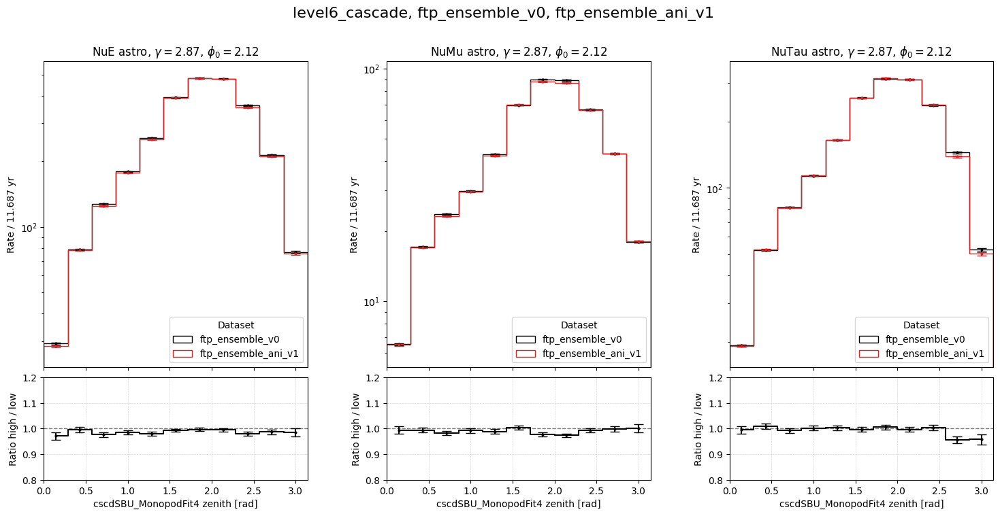

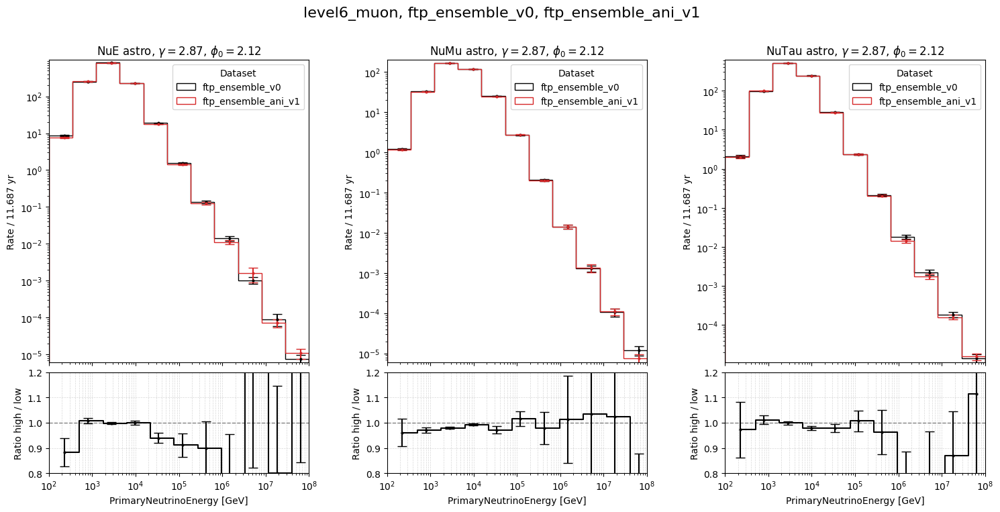

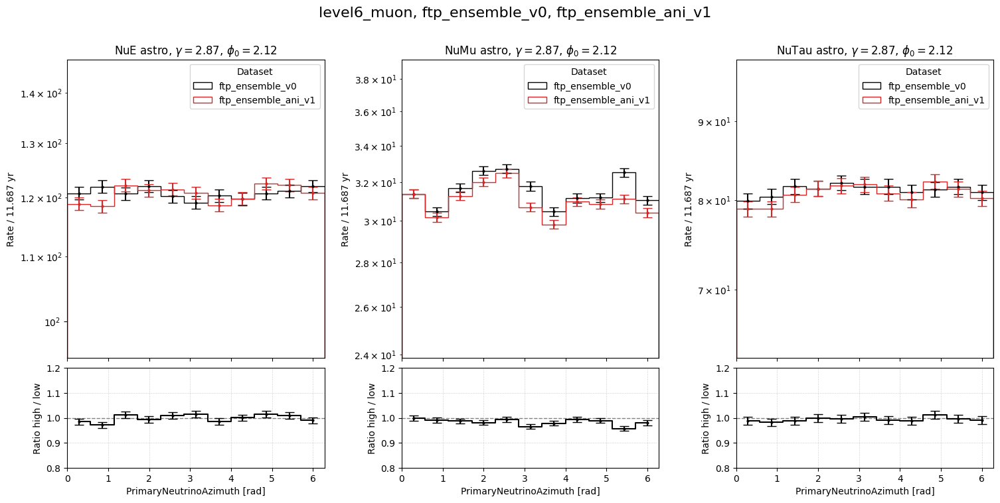

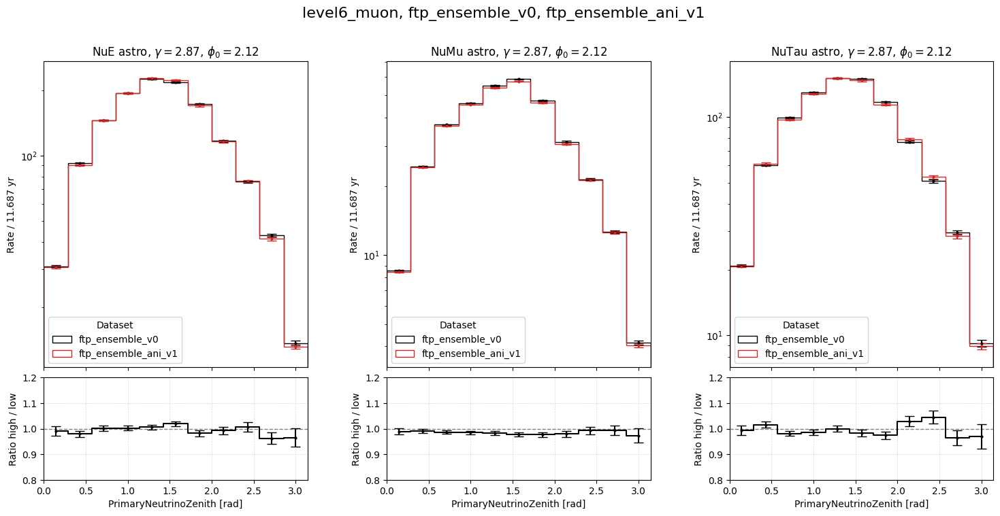

/mnt/ceph1-npx/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/advanced_plotting.py:158: RuntimeWarning: invalid value encountered in divide
  ratio = hist_alt / hist_base
/mnt/ceph1-npx/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/advanced_plotting.py:175: RuntimeWarning: invalid value encountered in divide
  (hist_base_error / hist_base)**2 + (hist_alt_error / hist_alt)**2
/mnt/ceph1-npx/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/advanced_plotting.py:184: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(0.8 * np.min([hist_base.min(), hist_alt.min()]),


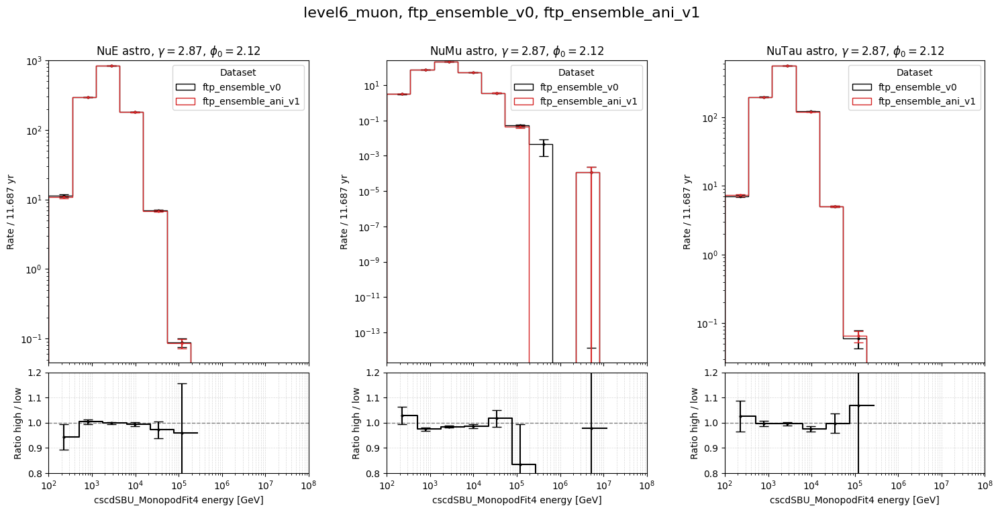

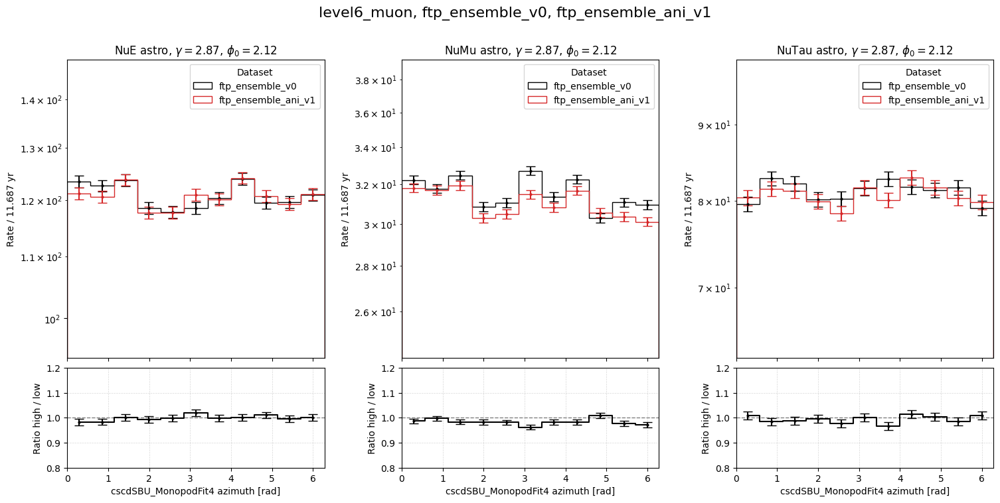

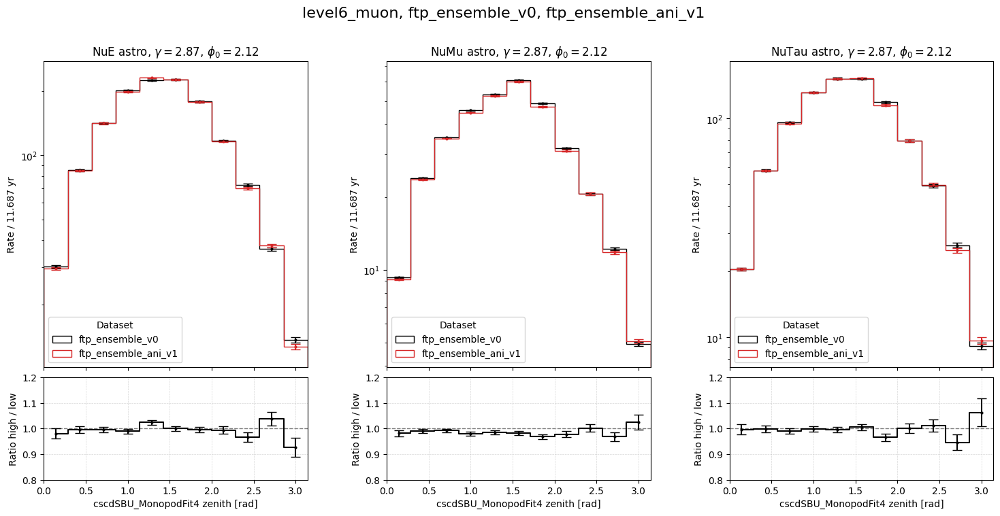

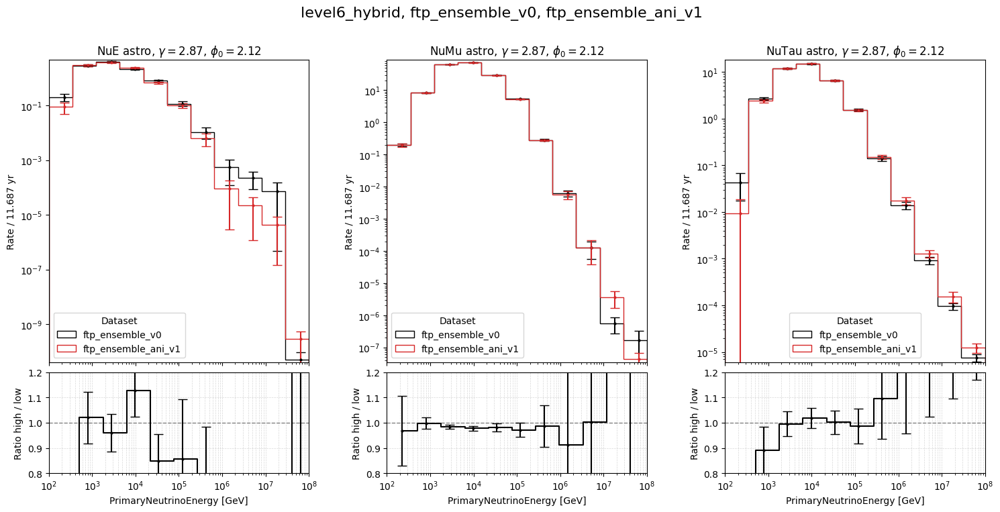

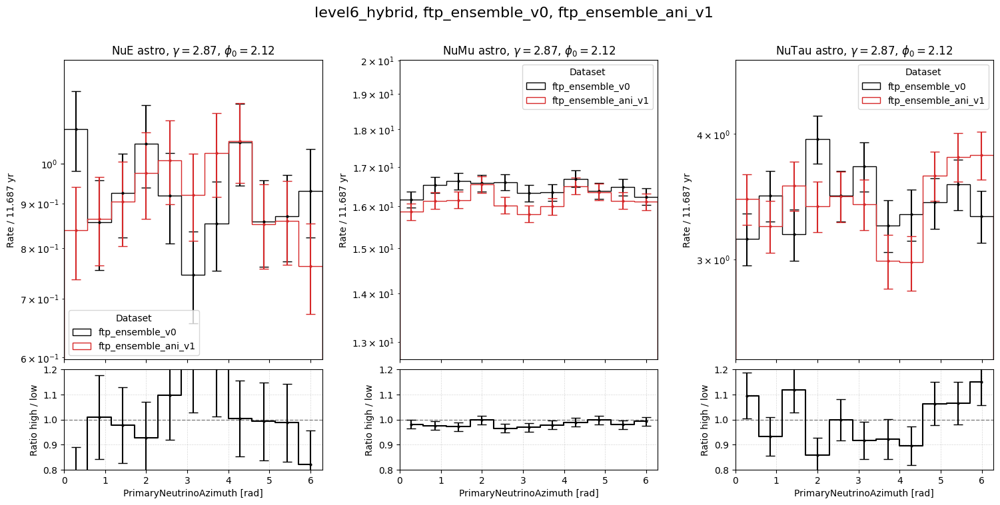

/mnt/ceph1-npx/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/advanced_plotting.py:158: RuntimeWarning: divide by zero encountered in divide
  ratio = hist_alt / hist_base


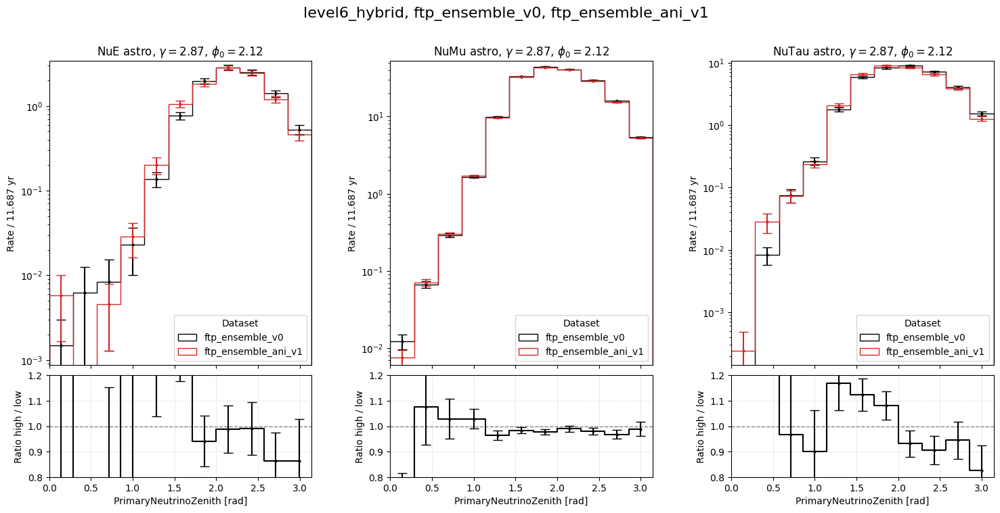

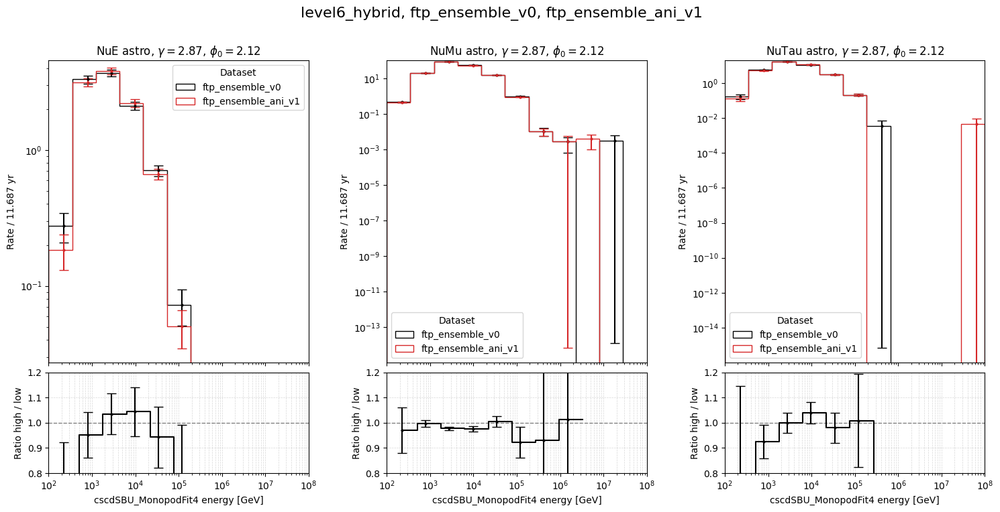

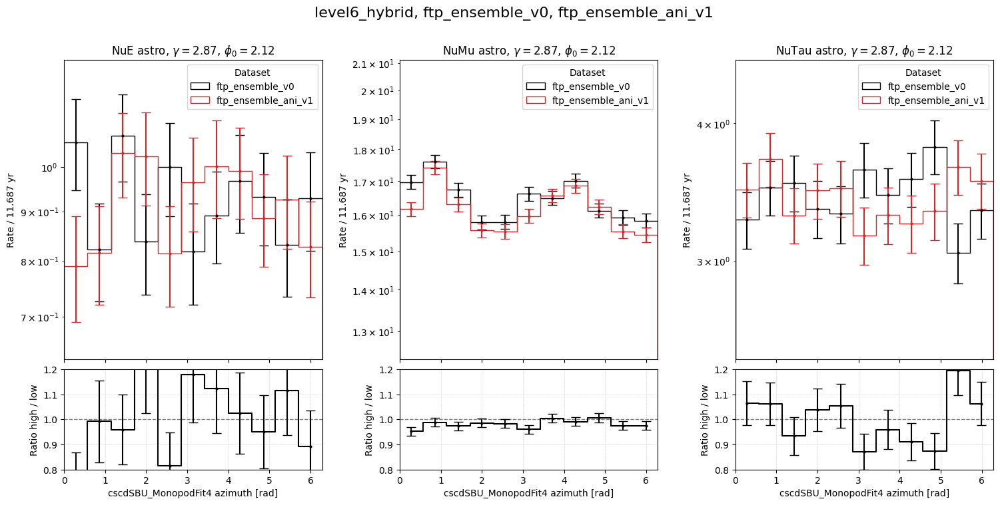

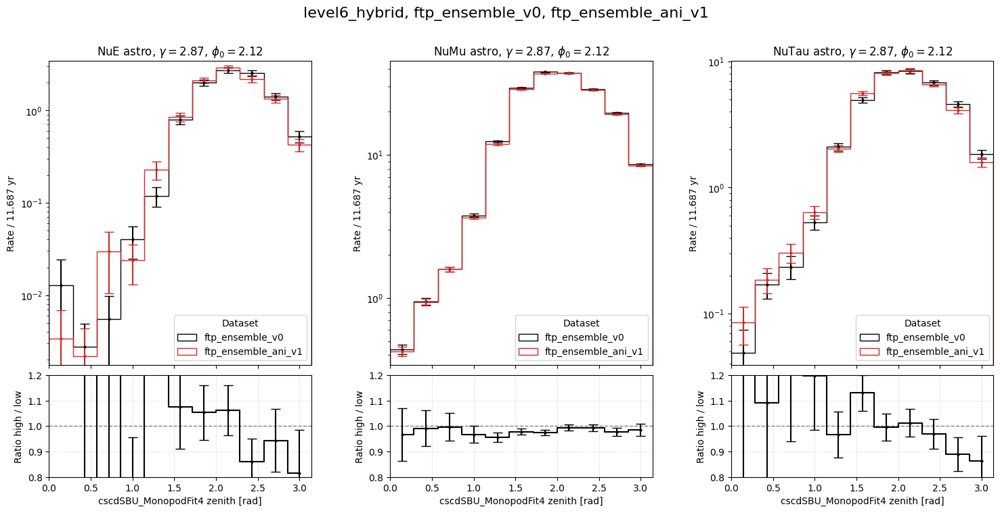

In [56]:
###
### Compare ensemble philipp and me
###
from advanced_plotting import *
from variables import variables
from systematics import systematics

levels = ["level6_cascade","level6_muon","level6_hybrid"]
# levels = ["level6_cascade"]

base_key = "ftp_ensemble_v0"
alt_key = "ftp_ensemble_ani_v1"

outpath = f"/data/user/tvaneede/GlobalFit/reco_processing/notebooks/documentation/plots/snowstorm/compare_dataset_flavor/{base_key}-{alt_key}"

for level in levels:
    for plot_name, variable_settings in variables[level].items():
            
        plotting_path = f"{outpath}/{level}"
        os.system(f"mkdir -p {plotting_path}")
        plotting_path = f"{plotting_path}/{plot_name}.png"

        variable_settings["alt_var_key1"] = variable_settings["base_var_key1"]
        variable_settings["alt_var_key2"] = variable_settings["base_var_key2"]

        compare_dataset_flavor(
        simulation_datasets, 
        base_key = base_key,
        base_level = level,
        alt_key = alt_key,
        alt_level = level,
        **variable_settings,
        livetime_yr = livetime_yr,
        flux_gamma = 2.87,
        flux_norm  = 2.12,
        plotting_path = plotting_path)

    #     break
    # break